In [2]:
import umap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Loading the training fashion data

In [16]:
fashion_train = pd.read_csv("/Users/snigdha/Downloads/fashion-mnist_train.csv")

Splitting Class Variable and Other Training data

In [6]:
data = fashion_train.iloc[:, 1:].values.astype(np.float32)
target = fashion_train['label'].values

Creating a 2-dimensional representation of the data

In [7]:
reduce = umap.UMAP(random_state = 223)
embedding = reduce.fit_transform(data)

Making the representation a Pandas Dataframe for Modelling and Visualization Purposes

In [8]:
df = pd.DataFrame(embedding, columns=('x', 'y'))
df["class"] = target

Replacing Class numeric Values with Fashion Labels


In [9]:
labels = { 0: 'T-shirt/top', 1: 'Trouser', 2: 'Pullover', 3: 'Dress', 4: 'Coat', 
          5: 'Sandal', 6: 'Shirt', 7: 'Sneaker', 8 : 'Bag', 9 : 'Ankle boot'}

df["class"].replace(labels, inplace=True)

visualizing the data

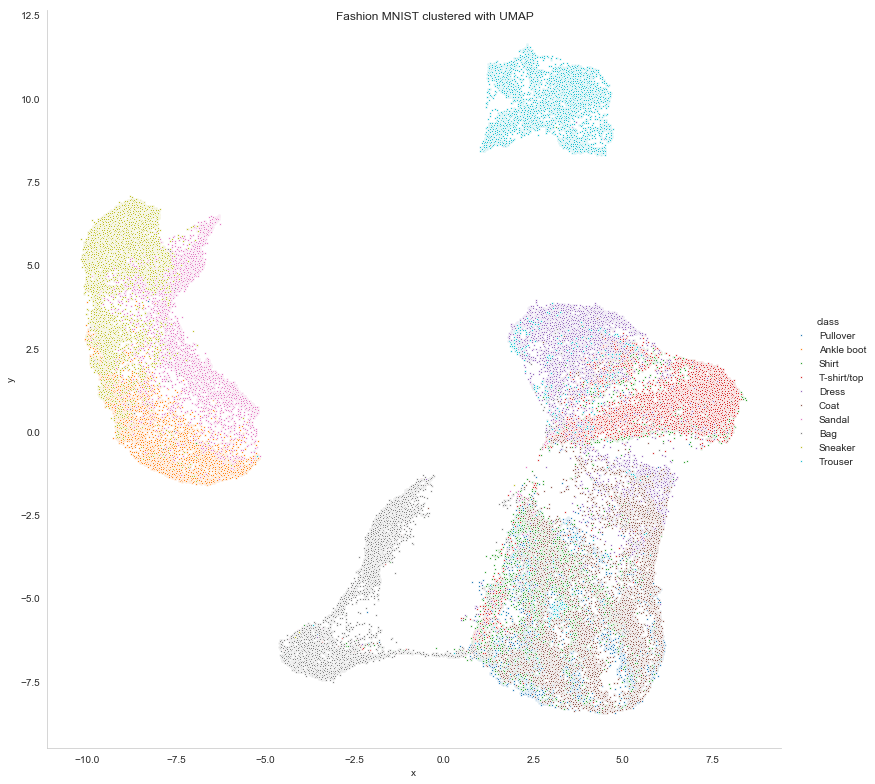

In [11]:
sns.set_style("whitegrid", {'axes.grid' : False})

ax = sns.pairplot(x_vars = ["x"], y_vars = ["y"],data = df, 
             hue = "class",height=11, plot_kws={"s": 4});
ax.fig.suptitle('Fashion MNIST clustered with UMAP') ;

Interactive 3-D plots using plotly

In [12]:
from ast import literal_eval
import plotly.offline as py
py.init_notebook_mode(connected = True)
import plotly.graph_objs as go
colors = ['rgb(0,31,63)', 'rgb(255,133,27)', 'rgb(255,65,54)', 'rgb(0,116,217)', 'rgb(133,20,75)', 'rgb(57,204,204)',
'rgb(240,18,190)', 'rgb(46,204,64)', 'rgb(1,255,112)', 'rgb(255,220,0)',
'rgb(76,114,176)', 'rgb(85,168,104)', 'rgb(129,114,178)', 'rgb(100,181,205)']
data_graph = []
for no, name in enumerate(np.unique(df["class"])):
    graph = go.Scatter3d(
    x = df[df["class"] == name]["x"],
    y = df[df["class"] == name]["y"],
    z = df[df["class"] == name]["class"],
    name = labels[no],
    mode = 'markers',
    marker = dict(
        size = 12,
        line = dict(
            color = '#%02x%02x%02x' % literal_eval(colors[no][3:]),
            width = 0.5
            ),
        opacity = 0.5
        )
    )
    data_graph.append(graph)
    
layout = go.Layout(
    scene = dict(
        camera = dict(
            eye = dict(
            x = 0.5,
            y = 0.5,
            z = 0.5
            )
        )
    ),
    margin = dict(
        l = 0,
        r = 0,
        b = 0,
        t = 0
    )
)
fig = go.Figure(data = data_graph, layout = layout)
py.iplot(fig, filename = '3d-scatter')